In [296]:
import pickle
import numpy as np
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from evaluation_util import plot, evaluate_on_dataset, perf_df

sc.set_figure_params(dpi=100, frameon=False, facecolor=None)

import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
dss_path = '/dss/dssfs02/lwp-dss-0001/pn36po/pn36po-dss-0001/di93zoj'

In [5]:
performances = {}

## garcia

In [59]:
%%time
with open(f'{dss_path}/garcia_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 25 ms, sys: 81.1 ms, total: 106 ms
Wall time: 141 ms


In [60]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['pcw'] = [float(p) if 'control' not in p else 8.6 for p in df.perturbation]

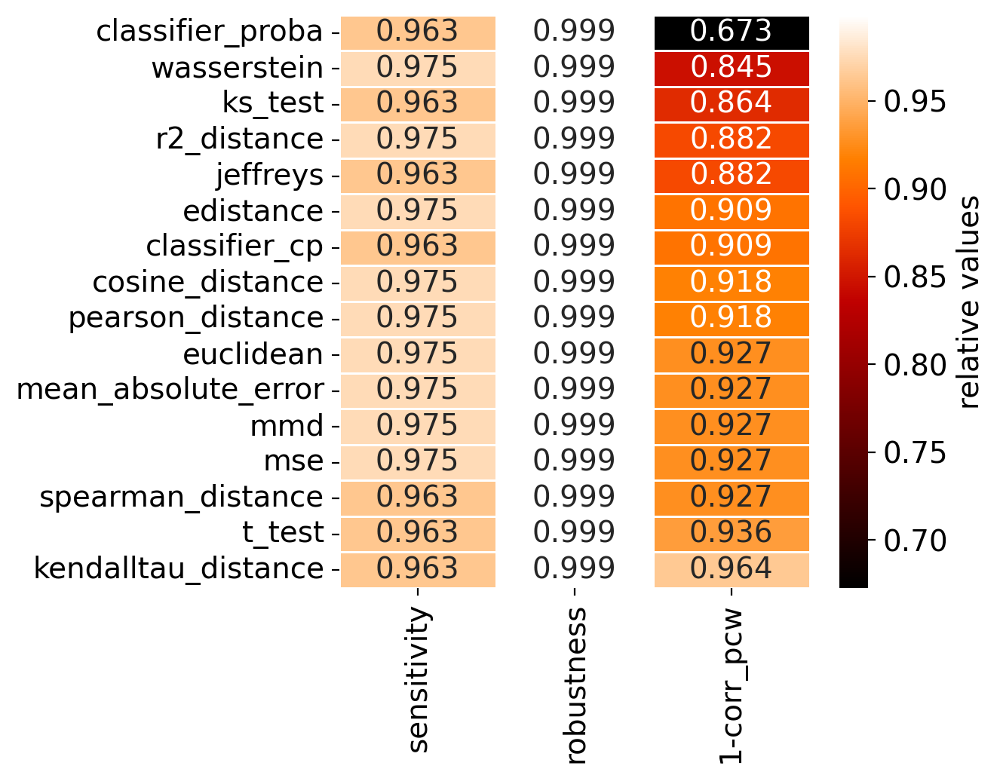

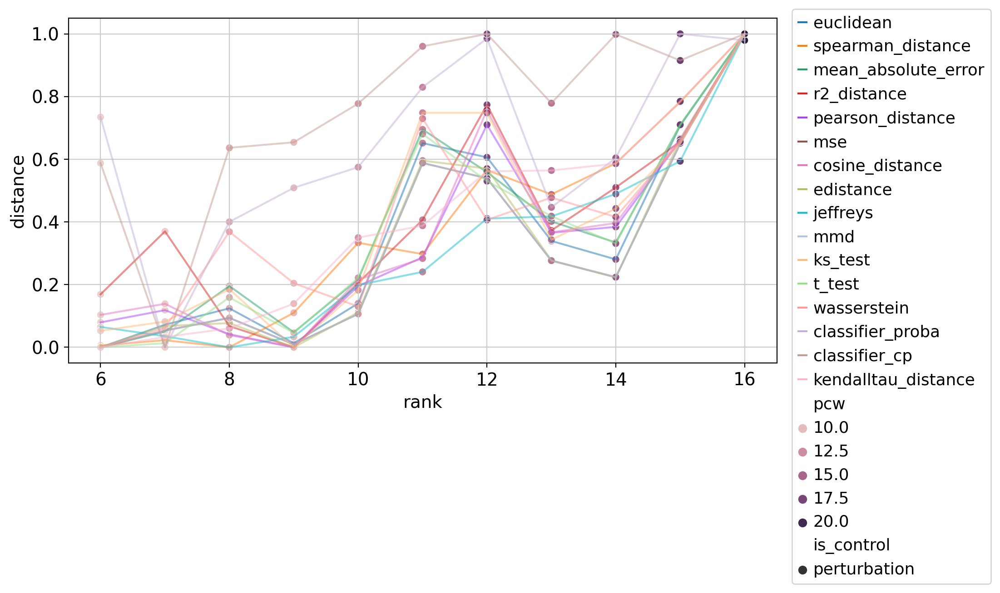

In [61]:
performances['garcia'] = evaluate_on_dataset(results, annotate, 'pcw', 'kendalltau_distance')

## schiebinger

In [309]:
%%time
with open(f'{dss_path}/schiebinger_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 48.8 ms, sys: 835 ms, total: 884 ms
Wall time: 2.48 s


In [310]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['day'] = [float(p[1:]) if 'D' in p else 0 for p in df.perturbation]

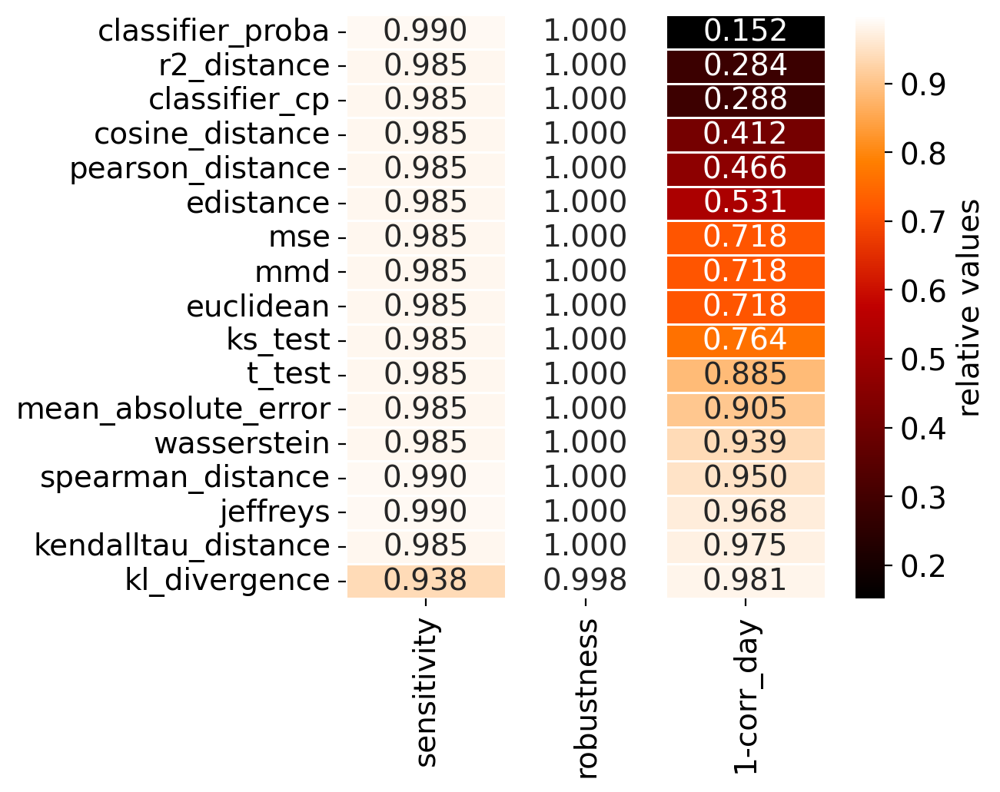

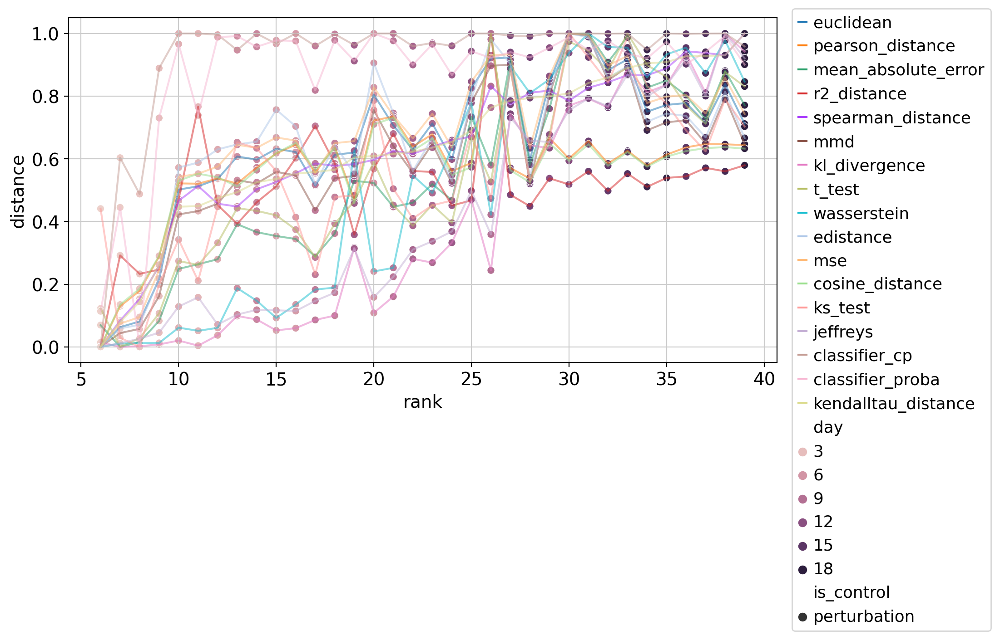

In [312]:
performances['schiebinger'] = evaluate_on_dataset(results, annotate, 'day', 'kendalltau_distance')

## satinha

In [65]:
%%time
with open(f'{dss_path}/satinha_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 44.2 ms, sys: 593 ms, total: 638 ms
Wall time: 668 ms


Don't think we have a source of ground truth in this dataset...

In [66]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = 1

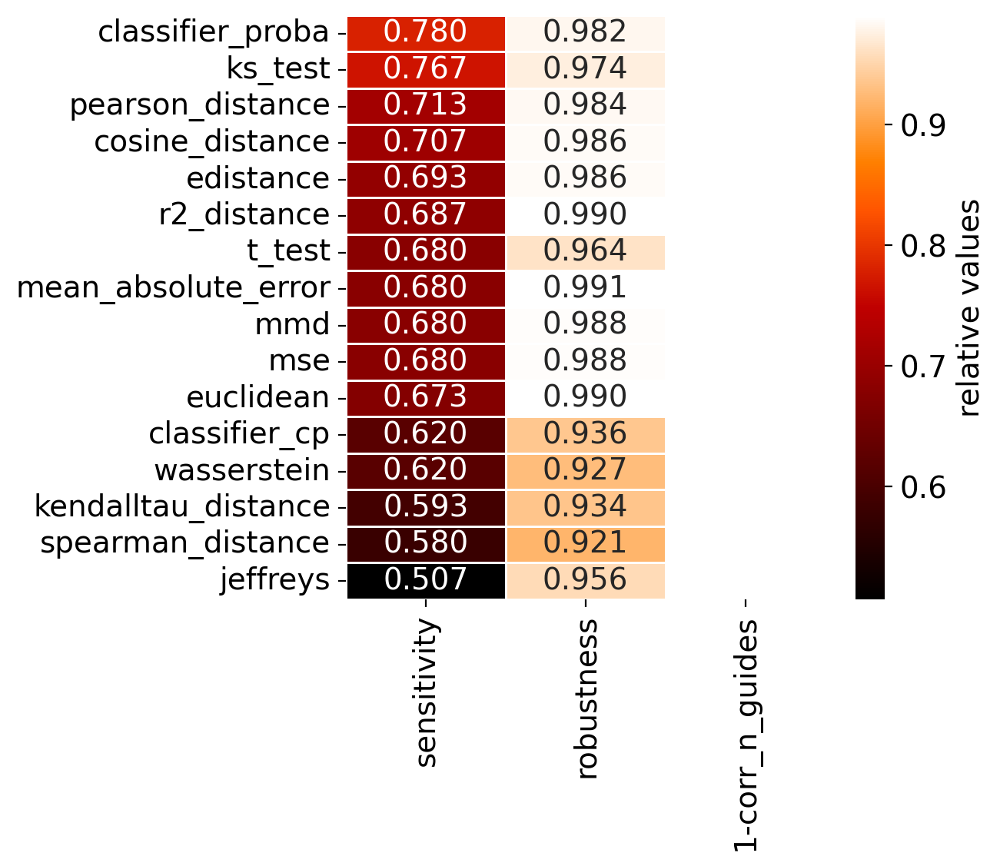

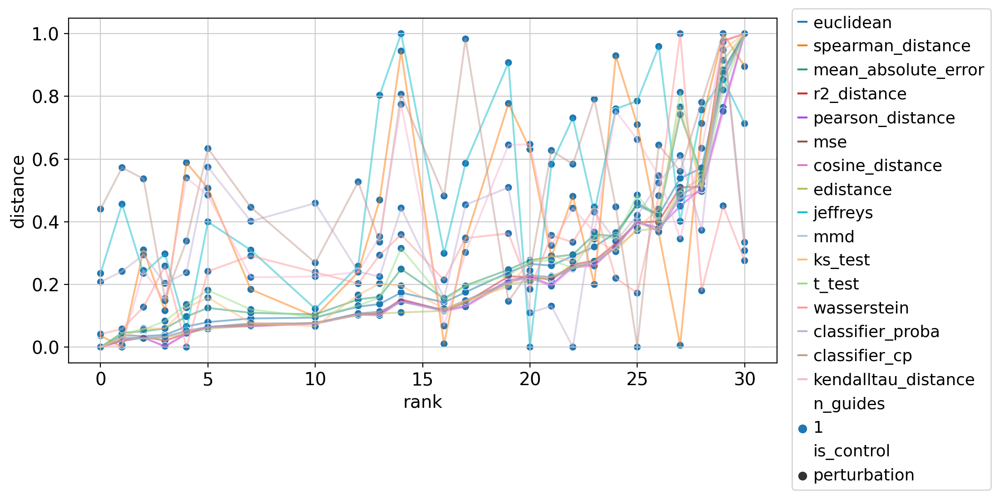

In [67]:
performances['satinha'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## norman

In [68]:
%%time
with open(f'{dss_path}/norman_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 55.2 ms, sys: 4.57 s, total: 4.63 s
Wall time: 4.65 s


In [69]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['n_guides'] = [int(s.count('+'))+1 for s in df.perturbation]

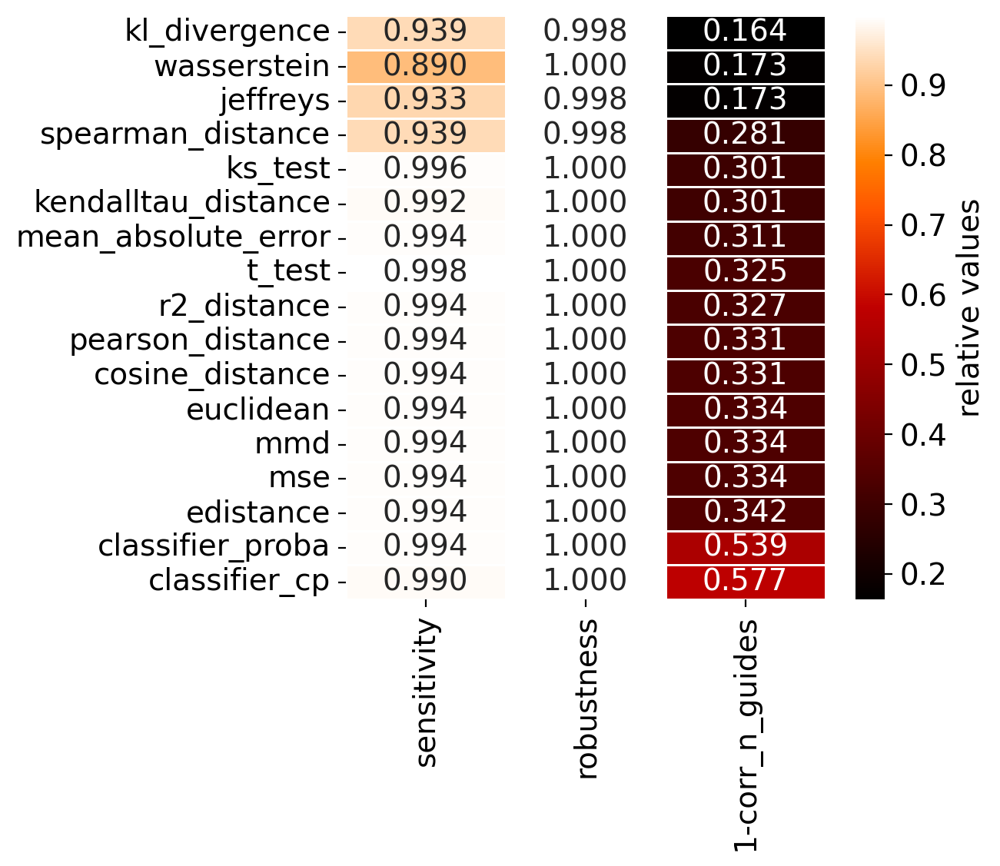

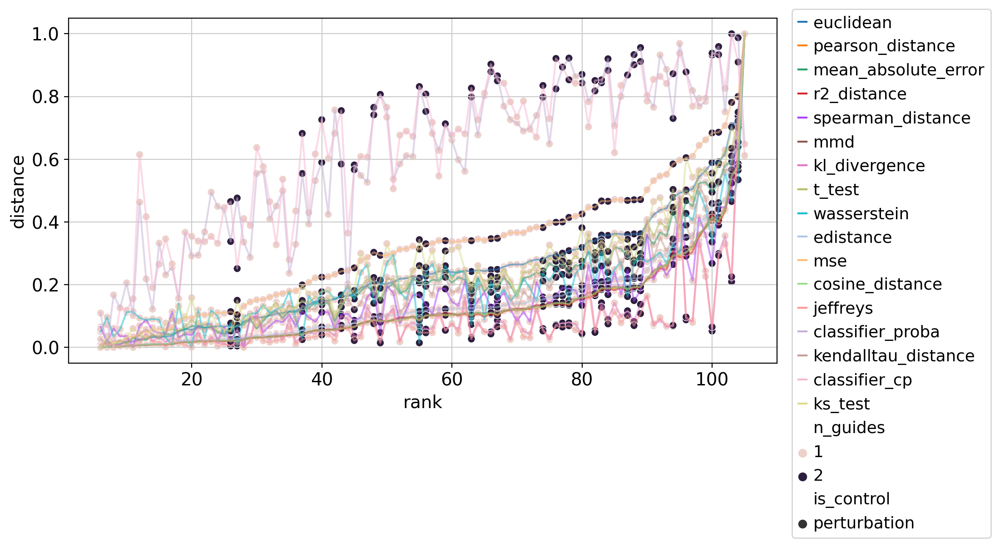

In [70]:
performances['norman'] = evaluate_on_dataset(results, annotate, 'n_guides', 'edistance')

## sciplex

In [71]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['dose'] = [0 if 'control' in x else float(x.split('_')[1]) for x in df.perturbation]
    df['log(dose)'] = [0 if 'control' in x else np.log10(float(x.split('_')[1])) for x in df.perturbation]

### MCF7

In [72]:
%%time
with open(f'{dss_path}/spMCF7_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 52.1 ms, sys: 2.22 s, total: 2.27 s
Wall time: 2.29 s


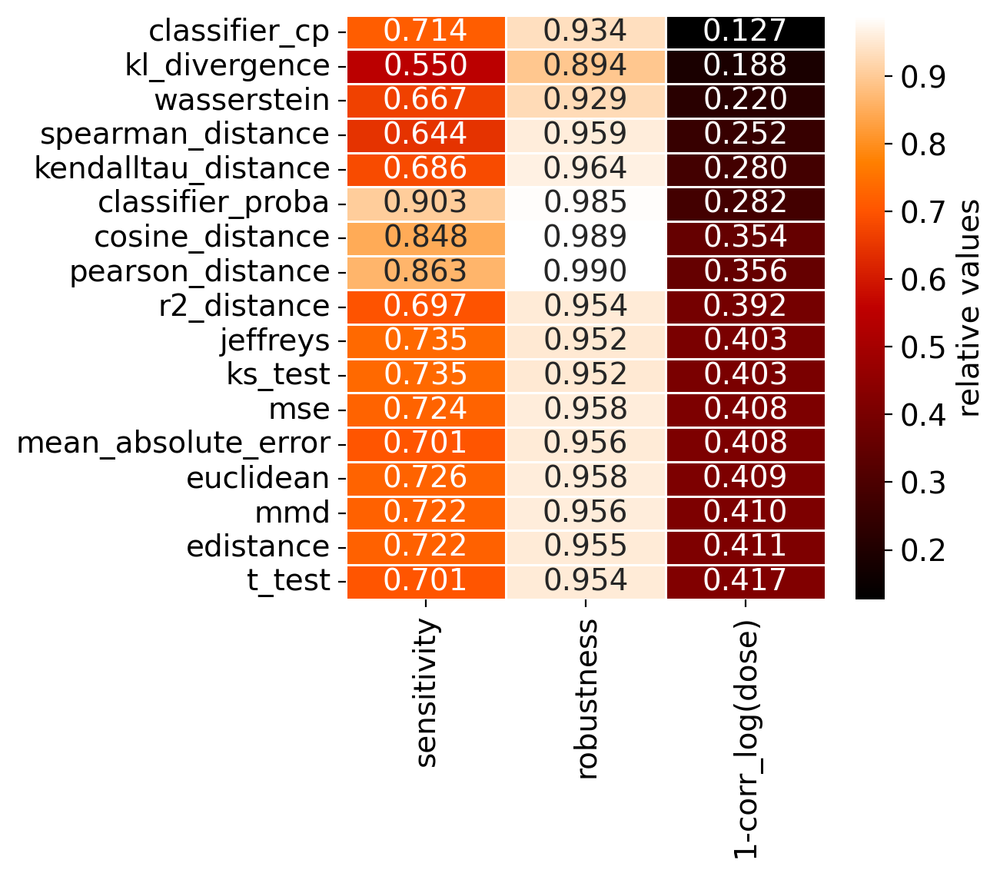

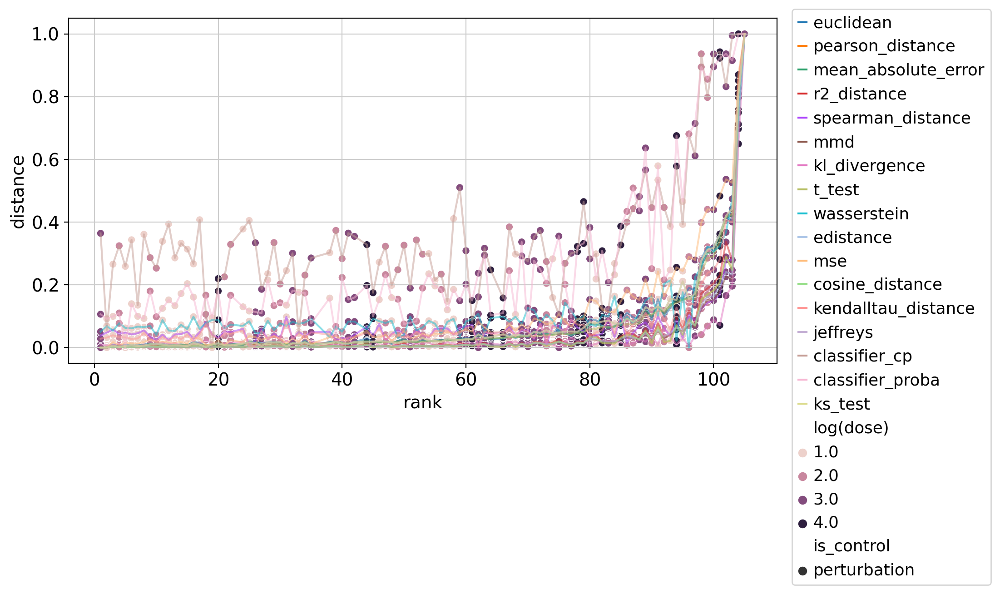

In [73]:
performances['sciplex_MCF7'] = evaluate_on_dataset(results, annotate, 'log(dose)', 't_test')

### A549

In [74]:
%%time
with open(f'{dss_path}/spA549_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 28.9 ms, sys: 887 ms, total: 916 ms
Wall time: 938 ms


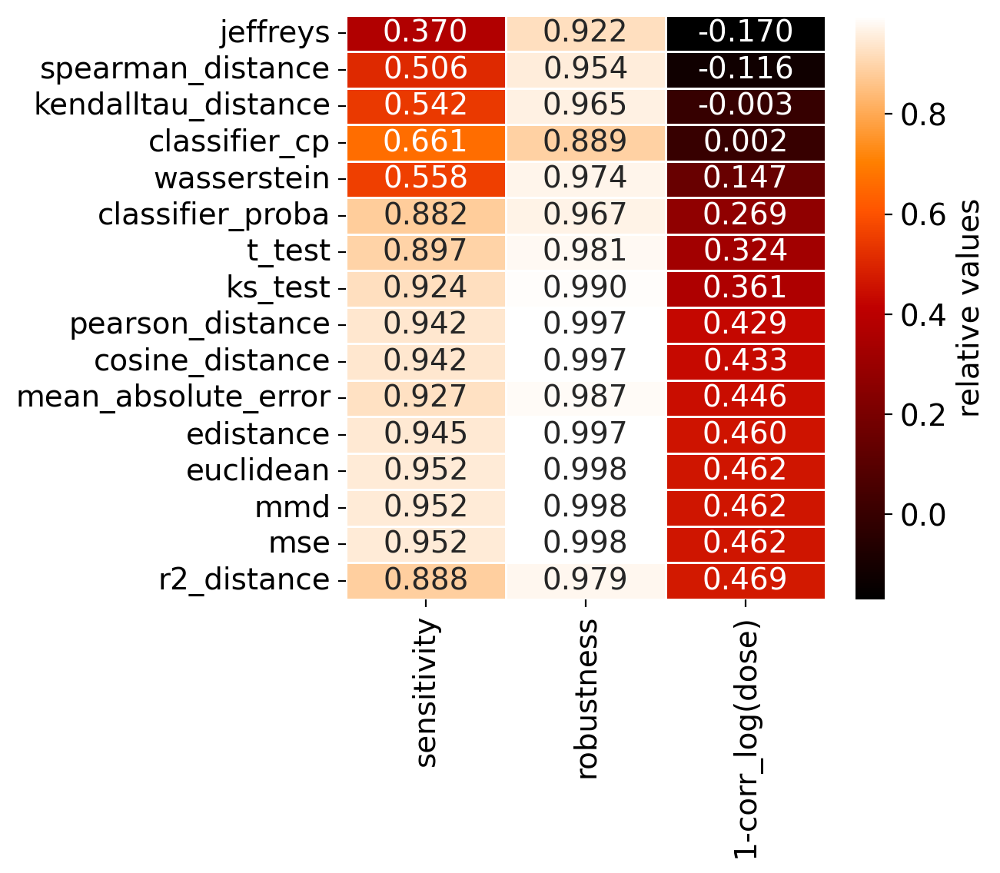

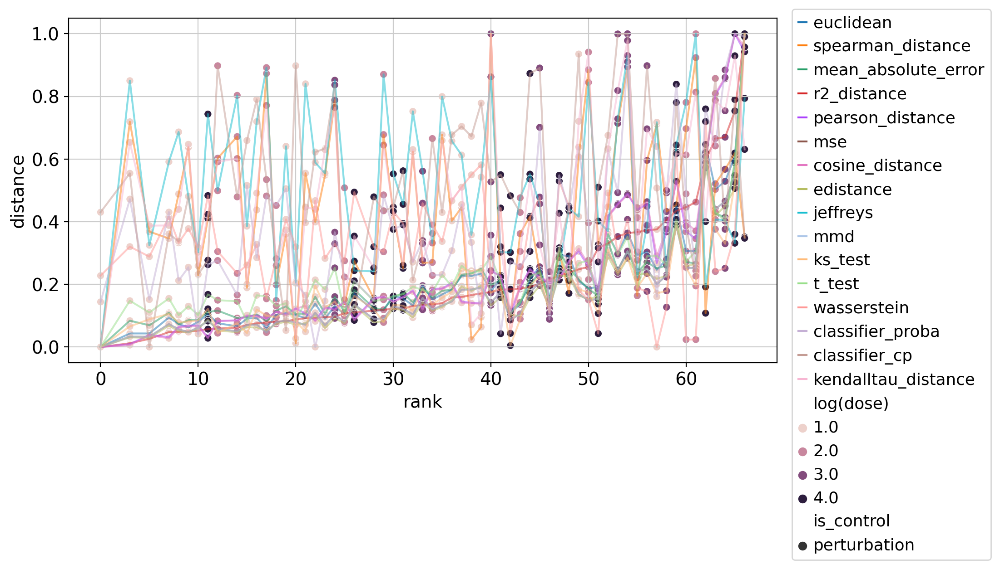

In [75]:
performances['sciplex_A549'] = evaluate_on_dataset(results, annotate, 'log(dose)', 'r2_distance')

### K562

In [76]:
%%time
with open(f'{dss_path}/spK562.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['10-lognorm-n_genes', '50-lognorm-n_genes', '100-lognorm-n_genes', '500-lognorm-n_genes', '1000-lognorm-n_genes', '2000-lognorm-n_genes', '5000-lognorm-n_genes', '100-lognorm-n_cells', '150-lognorm-n_cells', '200-lognorm-n_cells', '250-lognorm-n_cells', '270-lognorm-n_cells', '0.524-lognorm-count_mean', '0.491-lognorm-count_mean', '0.453-lognorm-count_mean', '0.415-lognorm-count_mean', '0.376-lognorm-count_mean', '0.336-lognorm-count_mean', '0.296-lognorm-count_mean', '0.256-lognorm-count_mean', '0.216-lognorm-count_mean', '10-lognorm-n_DEGs', '20-lognorm-n_DEGs', '30-lognorm-n_DEGs', '40-lognorm-n_DEGs', '50-lognorm-n_DEGs', '100-lognorm-n_DEGs', '150-lognorm-n_DEGs', '200-lognorm-n_DEGs', '300-lognorm-n_DEGs', '400-lognorm-n_DEGs', '0.490-lognorm-count_mean'])
CPU times: user 655 ms, sys: 24 s, total: 24.7 s
Wall time: 24.7 s


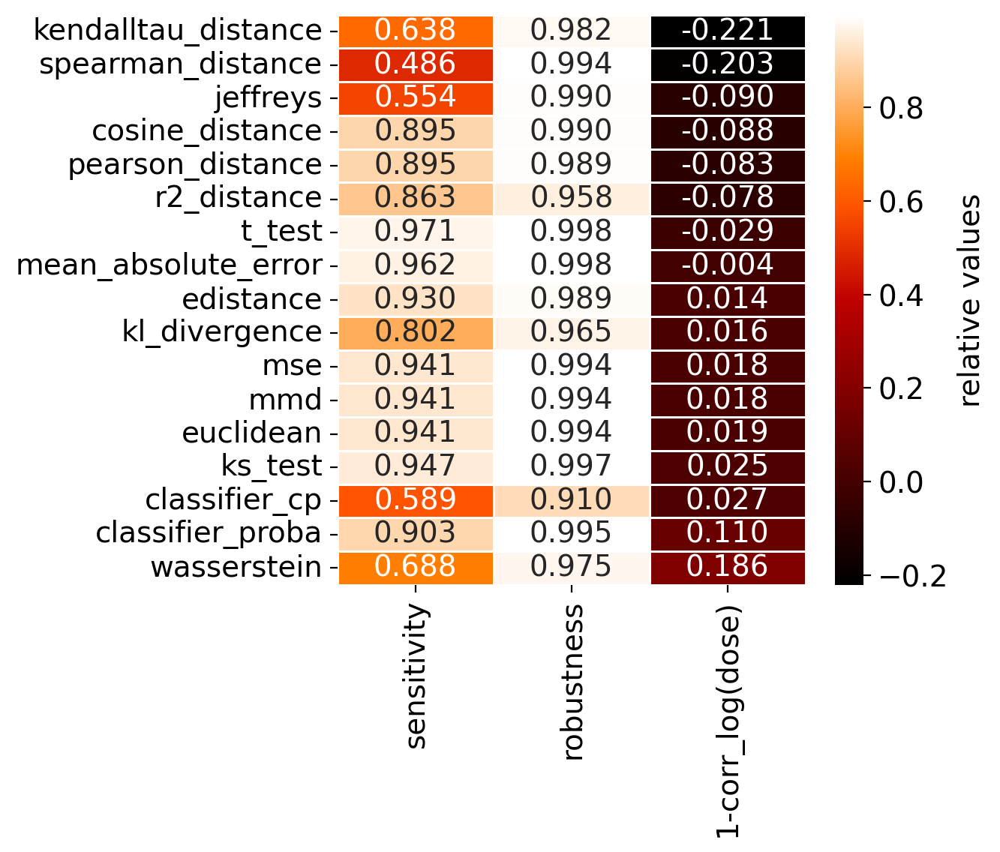

In [ ]:
performances['sciplex_K562']  = evaluate_on_dataset(results, annotate, 'log(dose)', 'wasserstein')

## mcfarland

In [78]:
%%time
with open(f'{dss_path}/mcfarland_sub.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['1000-lognorm-n_genes', '2000-lognorm-n_genes'])
CPU times: user 14.5 ms, sys: 26.2 ms, total: 40.8 ms
Wall time: 63.1 ms


In [79]:
def annotate(df):
    """Dataset specific source of ground truth."""
    df['time'] = [0 if 'control' in p else p.split('_')[1] for p in df.perturbation]

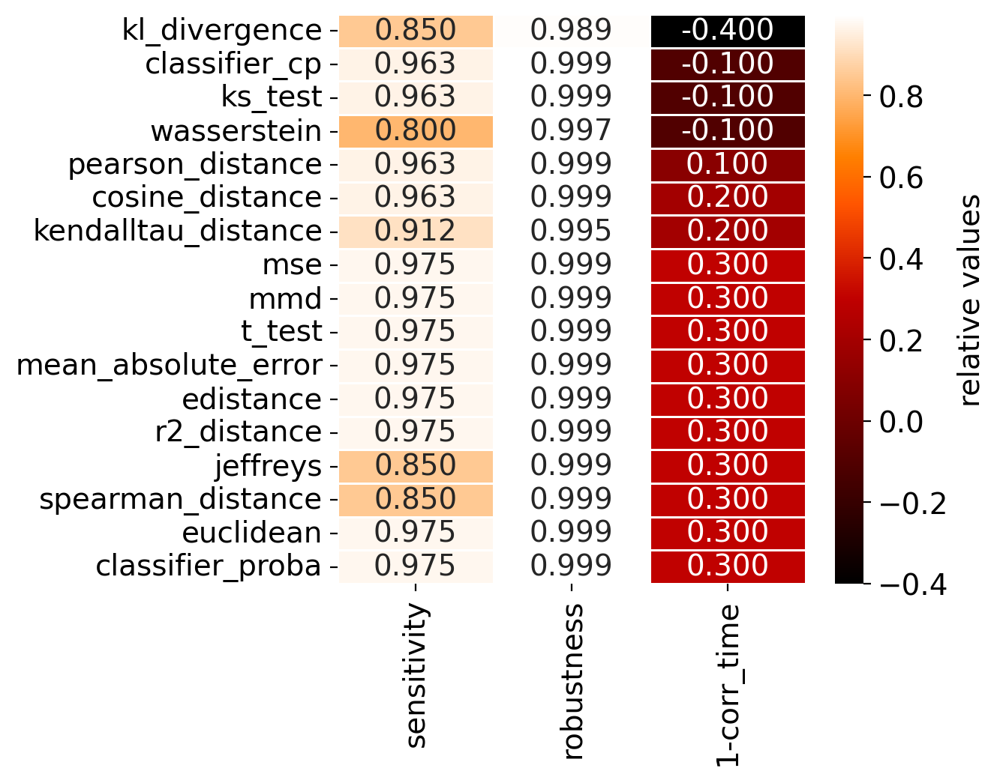

In [ ]:
performances['mcfarland'] = evaluate_on_dataset(results, annotate, 'time', 'mean_absolute_error')

## simulated

In [81]:
%%time
with open('metric_runs_simulated2.pkl', 'rb') as file:
    results = pickle.load(file)
print(results.keys())

dict_keys(['100-pca-n_cells', '100-lognorm-n_cells', '100-counts-n_cells', '200-pca-n_cells', '200-lognorm-n_cells', '200-counts-n_cells', '300-pca-n_cells', '300-lognorm-n_cells', '300-counts-n_cells', '400-pca-n_cells', '400-lognorm-n_cells', '400-counts-n_cells', '500-pca-n_cells', '500-lognorm-n_cells', '500-counts-n_cells', '600-pca-n_cells', '600-lognorm-n_cells', '600-counts-n_cells', '10-lognorm-n_genes', '10-counts-n_genes', '10-pca-n_genes', '50-lognorm-n_genes', '50-counts-n_genes', '50-pca-n_genes', '100-lognorm-n_genes', '100-counts-n_genes', '100-pca-n_genes', '500-lognorm-n_genes', '500-counts-n_genes', '500-pca-n_genes', '1000-lognorm-n_genes', '1000-counts-n_genes', '1000-pca-n_genes', '2000-lognorm-n_genes', '2000-counts-n_genes', '2000-pca-n_genes', '5000-lognorm-n_genes', '5000-counts-n_genes', '5000-pca-n_genes', '10-lognorm-n_DEGs', '10-counts-n_DEGs', '20-lognorm-n_DEGs', '20-counts-n_DEGs', '30-lognorm-n_DEGs', '30-counts-n_DEGs', '40-lognorm-n_DEGs', '40-counts

In [82]:
# get metadata
params = pd.read_csv('../splatter_sim_params.csv').reset_index()
params['perturbation'] = [f'Path{x}' for x in params['index'].values]
params.perturbation.replace({'Path1': 'control'}, inplace=True)

def annotate(df):
    # annotate
    for col in params.columns:
        df[col] = df['perturbation'].map(dict(zip(params.perturbation, params[col])))
    df = df.dropna()  # dropping fake controls

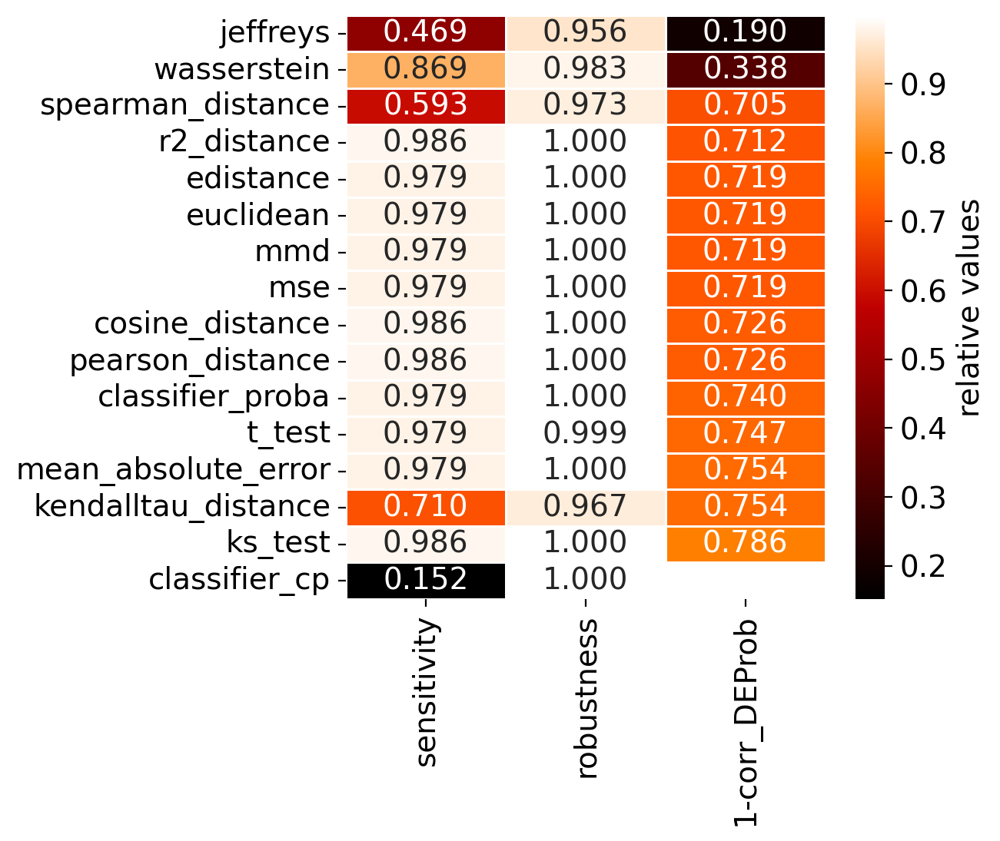

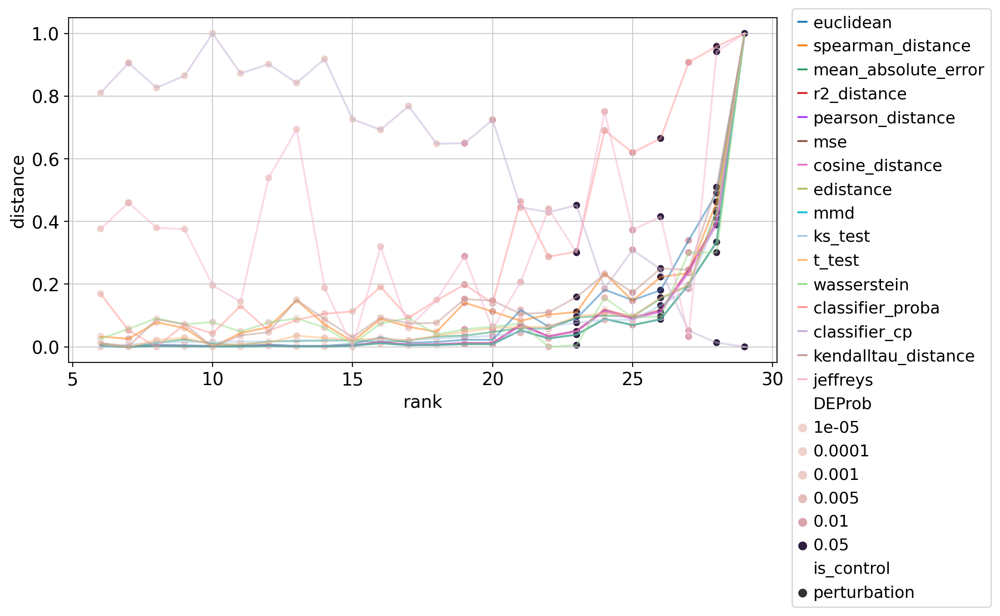

In [83]:
performances['simulated'] = evaluate_on_dataset(results, annotate, 'DEProb', 'ks_test')

## summary

In [84]:
dfs = []
for k, df in performances.items():
    sdf = df.add_suffix(f'_{k}')
    dfs.append(sdf)

In [85]:
df = pd.concat(dfs, axis=1)

Remove KL divergence because it's been replaced with symmetric KL. Also drop any columns that are completely empty because evaluation wasn't possible.

In [86]:
df = df.drop(['kl_divergence'], axis=0).dropna(axis=1, how='all')

Rename the distance metrics for consistency with publication.

In [87]:
df.index = [' '.join(x.split('_')) for x in df.index]
df = df.rename({
    'euclidean':'Euclidean',
    'mse':'MSE',
    'mmd':'MMD',
    'edistance':'E-distance',
    'pearson distance': 'Pearson',
    't test': 'T-test',
    'r2 distance': 'R2',
    'ks test': 'KS statistic',
    'kendalltau distance': 'Kendall tau distance',
    'spearman distance': 'Spearman',
    'classifier cp': 'classifier class projection',
    'wasserstein':'Wasserstein',
    'jeffreys':'symmetric KL div.'
})

Many of the plots will use scaled values. Also calculate the final ranking using the avg.

In [88]:
ndf = df.apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)), axis=0)
ndf = ndf.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
ndf.mean(axis=1)

mean absolute error            0.818015
Euclidean                      0.817798
MSE                            0.817456
MMD                            0.816065
cosine distance                0.804267
Pearson                        0.799681
E-distance                     0.799644
classifier proba               0.792345
T-test                         0.748430
R2                             0.736316
KS statistic                   0.719425
Kendall tau distance           0.484629
Spearman                       0.447467
Wasserstein                    0.437621
symmetric KL div.              0.408854
classifier class projection    0.403583
dtype: float64

Standardize the order of the dataframe and save.

In [89]:
df = df.loc[ndf.mean(axis=1).sort_values(ascending=False).index]
df.to_csv('results_table.csv')

Plot absolute values.

In [265]:
types = {
    'E-distance':'Ia',
    'Euclidean':'Ia',
    'KS statistic':'Ia',
    'Kendall tau distance':'III',
    'MMD':'Ia',
    'MSE':'Ia',
    'Pearson':'II',
    'R2':'II',
    'Spearman':'III',
    'T-test':'Ib',
    'Wasserstein':'III',
    'classifier class projection':'-',
    'classifier proba':'II',
    'cosine distance':'II',
    'mean absolute error':'Ib',
    'symmetric KL div.':'III',
}

type_to_rank = {
    'Ia': 1,
    'Ib': 2,
    'II': 3,
    'III': 4,
}

color_dict = {
    'garcia':'orange',
    'schiebinger':'salmon',
    'satinha':'yellowgreen',
    'norman':'darkgreen',
    'MCF7':'lightblue',
    'A549':'steelblue',
    'K562':'blue',
    'mcfarland':'darkblue',
    'simulated':'grey'
}

trio = ['indianred', 'darkseagreen', 'thistle']
cmap = 'bone'
bar_color = 'lightslategrey'

def xtick_off(ax):
    ax.set_xticklabels([])
    ax.set_xticks([])

def ytick_off(ax):
    ax.set_yticklabels([])
    ax.set_yticks([])
    
def add_type(df):
    df['type'] = df.index.map(types)
    return df

def plt_bar(df, title=None, cmap='twilight'):
    plt.figure(facecolor='none')
    sns.barplot(x=df.index, y=0, hue="type", data=df, palette=cmap, dodge=False)
    plt.gca().axis('off')
    plt.grid(None)
    plt.title(title)

<Figure size 2400x600 with 0 Axes>

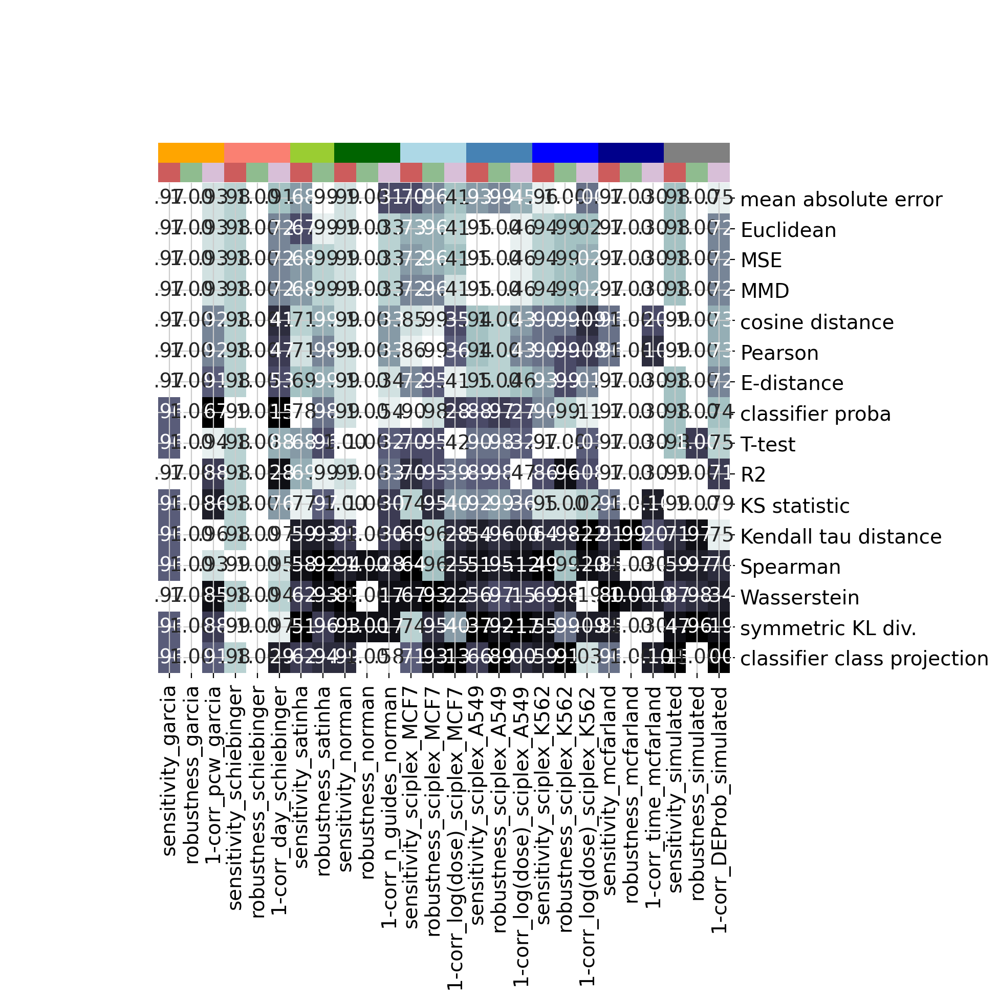

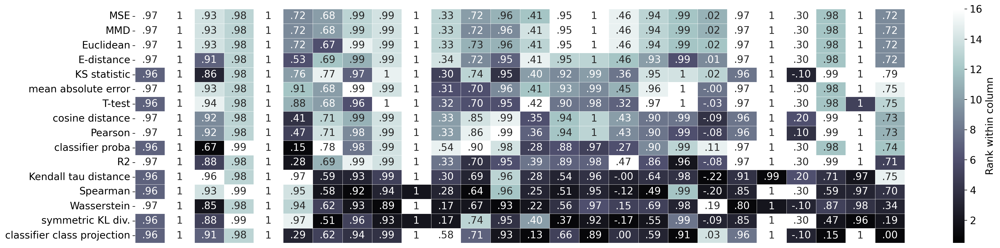

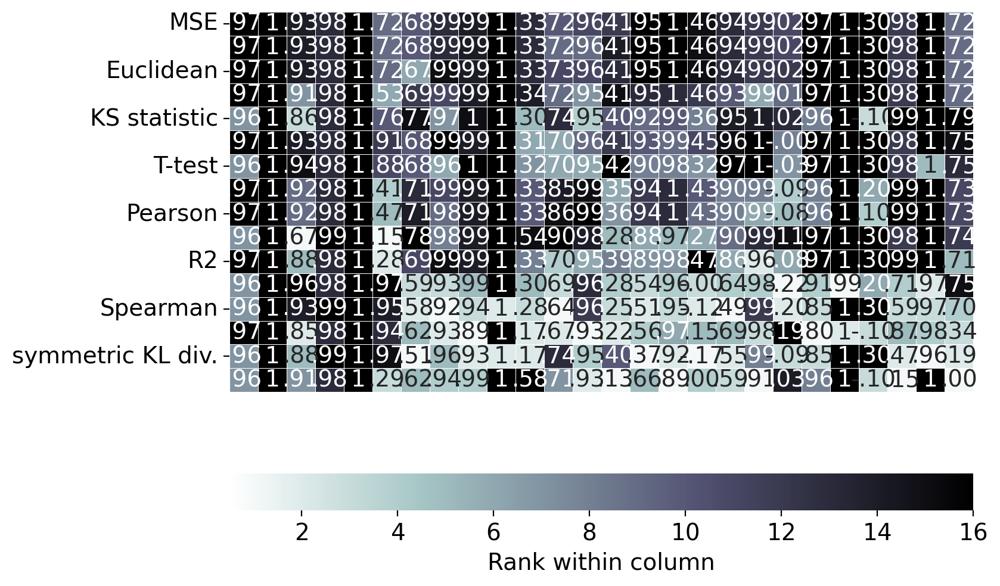

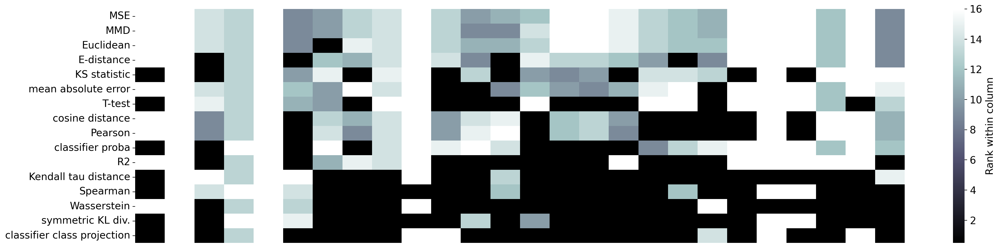

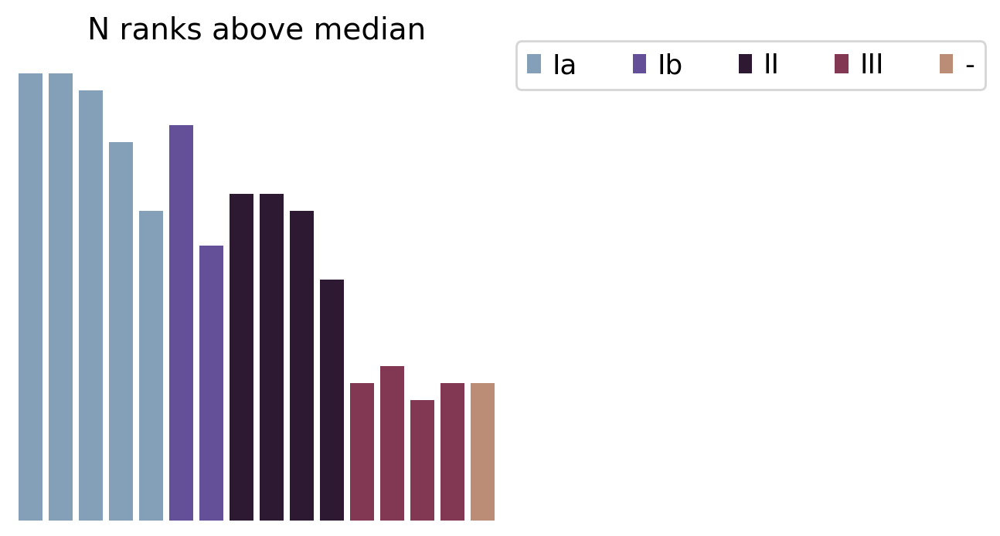

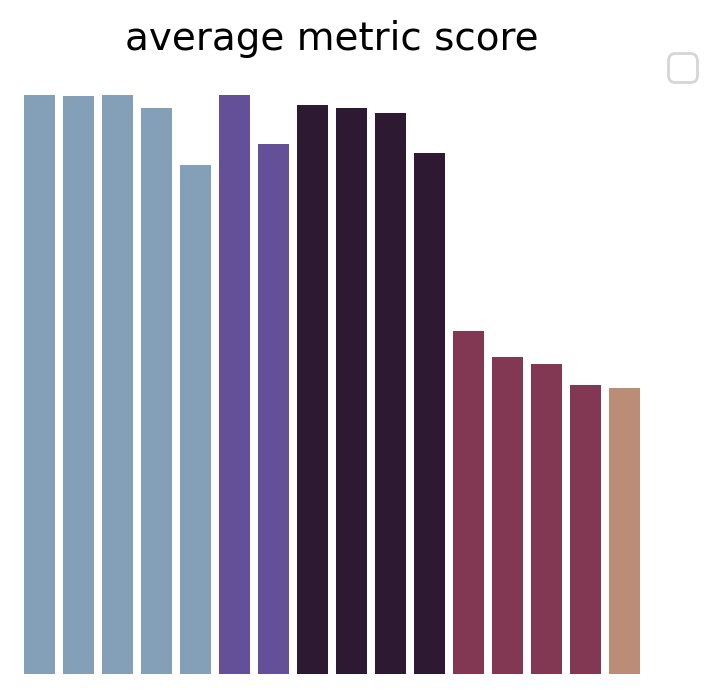

In [308]:
main_plot_df = df.copy()
main_plot_df = main_plot_df.fillna(0)

plt.figure(figsize=(24, 6))
# just for the col color
col_color_dataset = [color_dict[c.split('_')[-1]] for c in df.columns]
col_color_task = trio*2 + trio[:2] + trio*6
sns.clustermap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".")),
    cmap=cmap, fmt = '', cbar_kws={'label': 'Rank within column'},
    row_cluster=False, col_cluster=False, col_colors=[col_color_dataset, col_color_task],
    cbar_pos=None
)

# processing
main_plot_df.columns = ['_'.join(c.split('_')[:2]) for c in main_plot_df.columns]
main_plot_df = main_plot_df.rename(columns={'rank_mean':'CRP', 'rank_var*100':'robustness'})
halfway = 8
rank_df = main_plot_df.round(3).rank(method='max').clip(lower=halfway)

order = ['MSE', 'MMD', 'Euclidean', 'E-distance', 'KS statistic',  # type I
    'mean absolute error', 'T-test',  # Ib
    'cosine distance', 'Pearson', 'classifier proba', 'R2',  # II
    'Kendall tau distance', 'Spearman', 'Wasserstein', 'symmetric KL div.',   # III
    'classifier class projection']  # bad

# getting order automatically
# bar_df = add_type(pd.DataFrame((rank_df > 8).sum(axis=1)))
# bar_df['rank'] = bar_df.type.map(type_to_rank)
# order = bar_df.sort_values(by='rank').index

main_plot_df = main_plot_df.loc[order]
rank_df = rank_df.loc[order]

# the actual plot
plt.figure(figsize=(24, 6))
ax = sns.heatmap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1")),
    cmap=cmap, linewidths=.2, fmt = '',
    cbar_kws={'label': 'Rank within column'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.show()

# just for the colorbar
plt.figure(figsize=(8, 6))
ax = sns.heatmap(
    main_plot_df.round(3).rank(method='max'),
    annot=main_plot_df.fillna(0).applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1")),
    cmap=f'{cmap}_r', linewidths=.2, fmt = '',
    cbar_kws={'label': 'Rank within column', 'orientation': 'horizontal', 'location': 'bottom'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.show()

# for the plot showing that MSE performs above average in all datasets
plt.figure(figsize=(24, 6))
ax = sns.heatmap(
    rank_df.replace(halfway, 0),
    cmap=cmap, cbar_kws={'label': 'Rank within column'},
    vmin=.5
)
xtick_off(ax)
#     plt.xticks(rotation=90, ha='right')
plt.grid(None)
plt.show()

# pairs with the one without numbers
plt_bar(add_type(pd.DataFrame((rank_df > 8).sum(axis=1)).loc[order]), "N ranks above median")
plt.legend(bbox_to_anchor=(1.01, 1.05), ncol=5)
plt.show()

# pairs with the one with numbers
plt_bar(add_type(pd.DataFrame(ndf.mean(axis=1)).loc[order]), "average metric score")
plt.legend([], bbox_to_anchor=(1.01, 1.05))
plt.show()

Make the legend

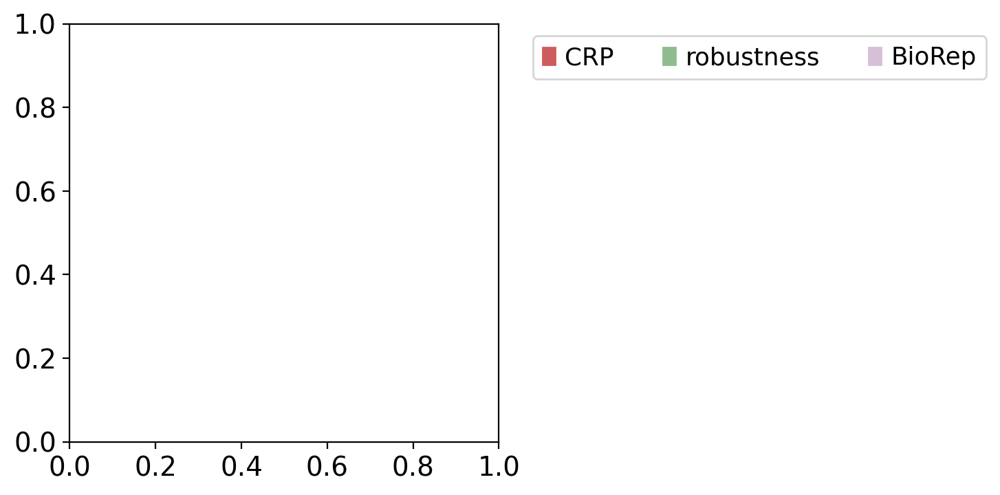

In [261]:
import matplotlib.patches as mpatches
patches = [mpatches.Patch(color=color, label=label) for color, label in zip(trio, ['CRP', 'robustness', 'BioRep'])]

plt.legend(handles=patches, ncol=3, bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(None)
plt.show()

In [298]:
def plot_sub(sub_df, cmap):
    sub_df = sub_df.loc[order]
    sub_df.columns = [c.split('_')[-1] for c in sub_df.columns]
    annot_df = sub_df.fillna(0)
    annot_df = annot_df.applymap(lambda x: "{:.2f}".format(x).replace("0.", ".").replace("1.00", "1"))
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        sub_df.round(3).rank(method='max'),
        annot=annot_df,
        cmap=cmap, linewidths=.5, fmt = '', cbar_kws={'label': 'Rank within column'}
    )
    plt.xticks(rotation=30, ha='right')
    plt.grid(None)
    plt.savefig(f'./figures/supp1_subres_{cmap}.pdf')
    plt.show()
    
    bar_df = pd.DataFrame(sub_df.mean(axis=1))
    bar_df = add_type(bar_df)
    plt_bar(bar_df)
    plt.legend([], bbox_to_anchor=(1.01, 1.05))
    plt.ylim(.26)
    plt.savefig(f'./figures/supp1_subresbar_{cmap}.pdf')
    plt.show()

    print(sub_df.mean())
    print('mean all:', sub_df.mean().mean())
    return sub_df

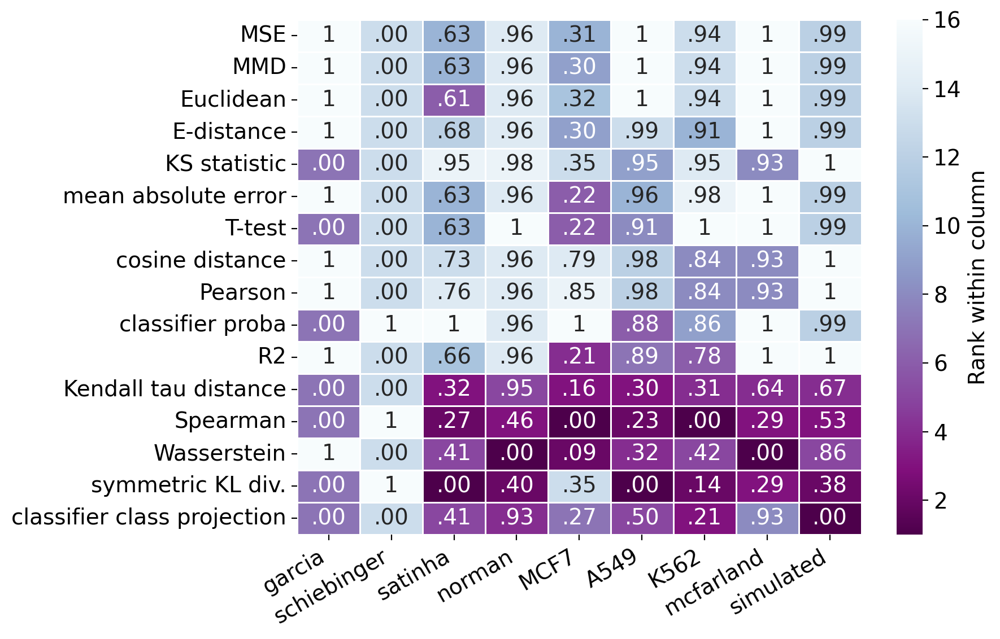

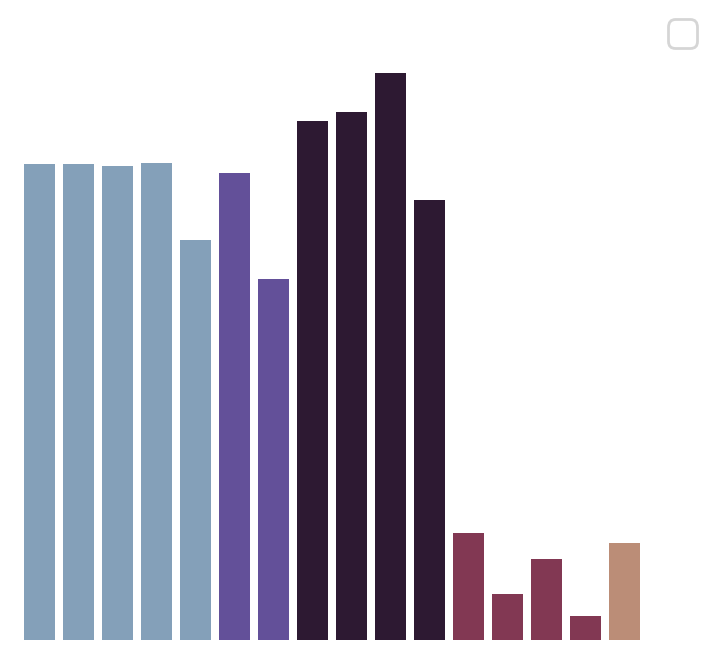

garcia         0.562500
schiebinger    0.187500
satinha        0.583841
norman         0.837719
MCF7           0.358456
A549           0.743815
K562           0.691176
mcfarland      0.808036
simulated      0.836260
dtype: float64
mean all: 0.6232560292924797


In [299]:
cols = [c for c in ndf.columns if 'sensitivity' in c]
sub_df = plot_sub(ndf[cols], 'BuPu_r')

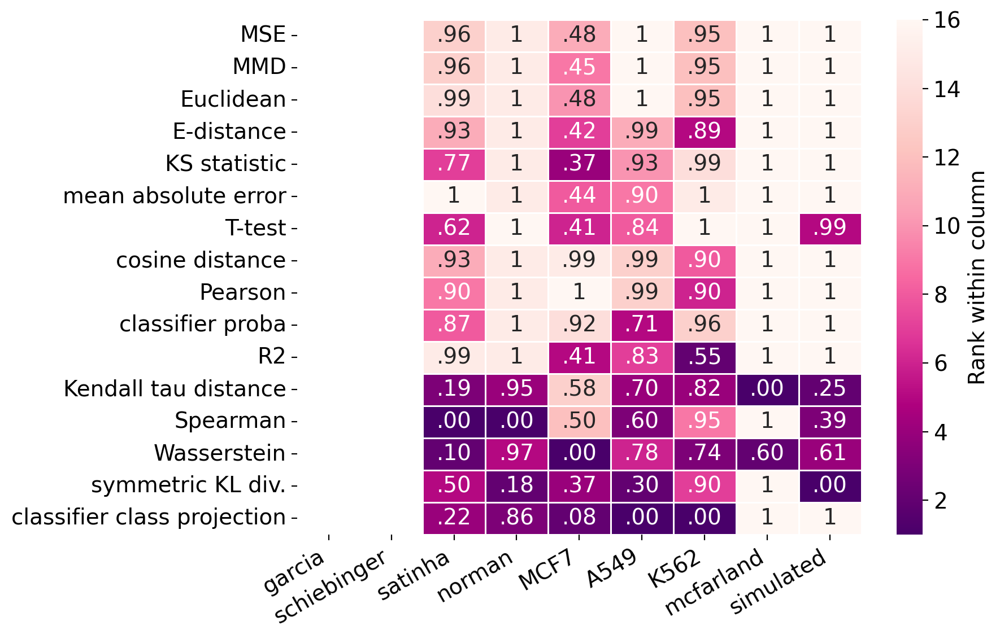

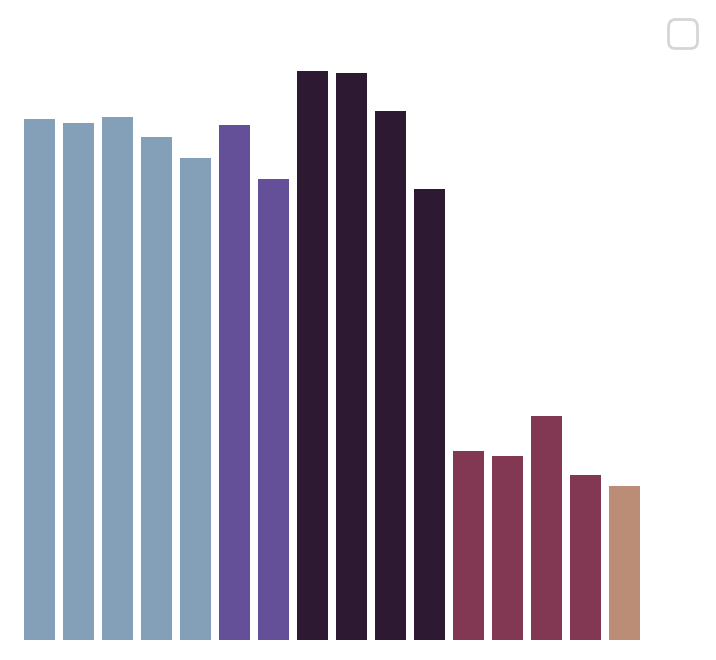

garcia              NaN
schiebinger         NaN
satinha        0.683333
norman         0.870146
MCF7           0.493747
A549           0.785956
K562           0.839624
mcfarland      0.912500
simulated      0.826541
dtype: float64
mean all: 0.7731210343524388


In [300]:
cols = [c for c in ndf.columns if 'robustness' in c]
sub_df = plot_sub(ndf[cols], 'RdPu_r')

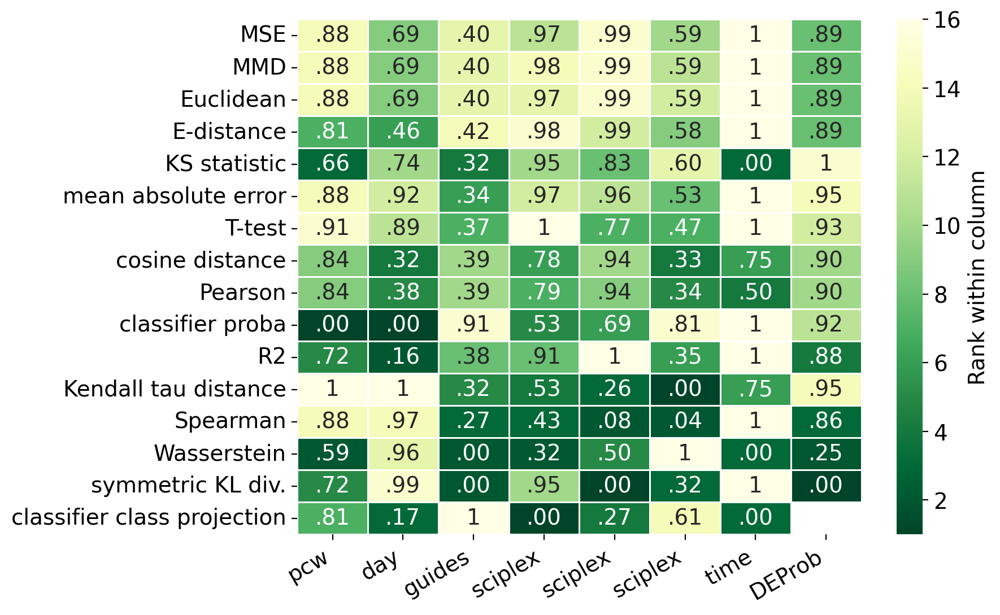

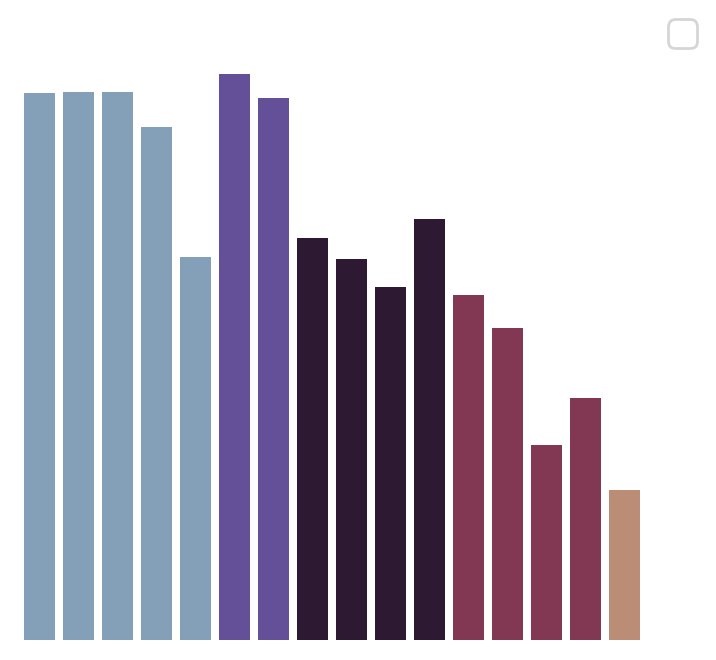

pcw        0.767578
day        0.625905
guides     0.393437
sciplex    0.754087
sciplex    0.699936
sciplex    0.484531
time       0.750000
DEProb     0.805917
dtype: float64
mean all: 0.6601737408690564


In [301]:
cols = [c for c in ndf.columns if 'sens' not in c and 'robu' not in c]
sub = ndf[cols]
sub.columns = ['_'.join(c.split('_')[:-1]) for c in sub.columns]
sub_df = plot_sub(sub, 'YlGn_r')

## cluster metrics based on performance

In [150]:
import anndata as ad

In [220]:
types = {
    'E-distance':'ia',
    'Euclidean':'ia',
    'KS statistic':'ia',
    'Kendall tau distance':'iii',
    'MMD':'ia',
    'MSE':'ia',
    'Pearson':'ii',
    'R2':'ii',
    'Spearman':'iii',
    'T-test':'ib',
    'Wasserstein':'iii',
#     'classifier class projection':'-',
    'classifier proba':'ii',
    'cosine distance':'ii',
    'mean absolute error':'ib',
    'symmetric KL div.':'iii',
}

In [221]:
perf = ad.AnnData(plot_df)
perf.obs['method'] = plot_df.index.astype('category')
perf.obs['type'] = perf.obs.method.map(types)
perf

AnnData object with n_obs × n_vars = 16 × 26
    obs: 'method', 'type'

In [222]:
sc.tl.pca(perf)
perf.obsm['X_pca'][:, 0] += np.random.normal(0, 0.01, perf.shape[0])  # Add jitter to the first component
perf.obsm['X_pca'][:, 1] += np.random.normal(0, 0.01, perf.shape[0])  # Add jitter to the second component

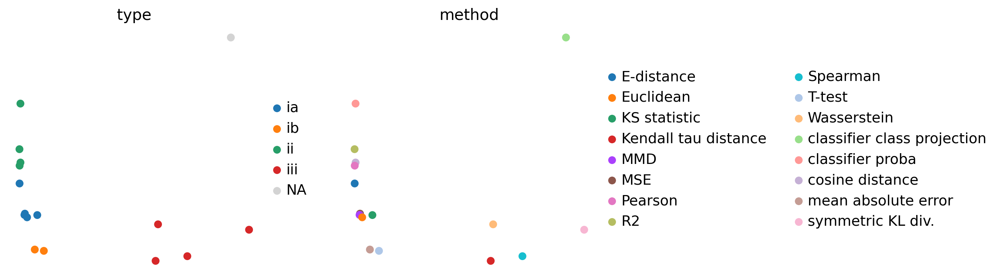

In [223]:
sc.pl.pca(perf, color=['type', 'method'], size=200)